# Rainfall Prediction - Weather Forecasting

## Problem Statement:

### Rain Prediction –Weather forecasting

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. **Here, predict two things:**

### Problem Statement:

* Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

* Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.

Number of columns: 23


Date  - The date of observation

Location  -The common name of the location of the weather station

MinTemp  -The minimum temperature in degrees celsius

MaxTemp -The maximum temperature in degrees celsius

Rainfall  -The amount of rainfall recorded for the day in mm

Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

Sunshine  -The number of hours of bright sunshine in the day.

WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight

WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

WindDir9am -Direction of the wind at 9am

WindDir3pm -Direction of the wind at 3pm

WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

Humidity9am -Humidity (percent) at 9am

Humidity3pm -Humidity (percent) at 3pm

Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

Cloud9am - Fraction of sky obscured by cloud at 9am. 

Cloud3pm -Fraction of sky obscured by cloud 

Temp9am-Temperature (degrees C) at 9am

Temp3pm -Temperature (degrees C) at 3pm

RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".



# First we will train model to predict whether or not it will rain tomorrow.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv(r'E:\Data Science Certificates\Evaluation project\Rainfall Prediction - Weather Forecasting\weatherAUS.csv')
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [3]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


Checking just some top and bottom lines to understand data

In [5]:
df.sample(5)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
3819,2016-03-13,Williamtown,20.6,30.8,0.0,20.6,8.9,E,43.0,NE,...,64.0,52.0,1020.0,1016.8,5.0,7.0,25.0,29.6,No,No
6532,2012-03-08,Brisbane,18.3,29.0,0.0,7.0,9.6,E,20.0,SSW,...,63.0,62.0,1011.5,1007.8,4.0,4.0,24.2,26.6,No,No
2869,2015-12-06,Williamtown,11.4,27.9,0.0,22.6,13.2,SE,31.0,NW,...,70.0,38.0,1020.3,1017.5,3.0,2.0,21.7,27.9,No,No
4050,2016-10-30,Williamtown,16.4,30.4,0.0,NaN,NaN,WSW,44.0,NNE,...,65.0,39.0,1014.5,1007.5,2.0,1.0,22.8,29.9,No,Yes
1699,2013-12-07,Newcastle,11.5,25.2,0.0,NaN,NaN,NaN,NaN,NaN,...,71.0,41.0,NaN,NaN,2.0,5.0,19.7,25.0,No,No


Checking sample which are picked randomely and I can see there are object data Null data available in dataset

In [6]:
#Let us check the name of our columns
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [7]:
df.shape

(8425, 23)

Our Dataset has total 8425 rows and 23 columns

In [8]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

We can see we have so many data missing almost in all columns except "date" and "Location" columns.

Before we start imputing we should check first datatypes of all columns so that we can decide which imputing technique shall we apply for null values

In [9]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [10]:
#Now Let us find the values of each Features in our data
for i in df.columns:
        print(df[i].value_counts())
        print('*'*100)

2011-03-14    5
2011-06-13    5
2011-05-08    5
2011-05-29    5
2011-05-26    5
             ..
2013-06-07    1
2013-05-24    1
2013-04-30    1
2013-05-30    1
2013-03-27    1
Name: Date, Length: 3004, dtype: int64
****************************************************************************************************
Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64
****************************************************************************************************
 12.0    74
 13.2    71
 13.8    69
 12.7    68
 14.8    67
         ..
-1.4      1
 26.6     1
 26.9     1
 0.3      1
-1.1      1
Name: MinTemp, Length: 285, dtype: int64
****************************************************************************************************
19.0    87
23.8    75
19.8  

From above we can observe count of each value in every columns so that we can have better idea of imputing 

Lets check for duplicate value in datasent

In [11]:
df.duplicated().sum()

1663

We can see that we have duplicates rows present in datasent which we should removed to train good model

In [12]:
df=df.drop_duplicates()


In [13]:
df.shape

(6762, 23)

We can see above as we removed duplicate rows from dataset now we have only 6762 rows and 23 columns

We have Date colums present in dataset however Datatype is showing as object so will will convert them in to date formate now

In [14]:

# Converting
df['Date']=pd.to_datetime(df['Date'])
df["Day"] = df['Date'].dt.day
df["Month"] = df['Date'].dt.month
df["Year"] = df['Date'].dt.year

In [15]:
# Now drop date coloumns from our data
df.drop("Date",axis=1,inplace=True)

In [16]:
df.isnull().sum()

Location            0
MinTemp            70
MaxTemp            57
Rainfall          138
Evaporation      2921
Sunshine         3236
WindGustDir       942
WindGustSpeed     942
WindDir9am        794
WindDir3pm        294
WindSpeed9am       63
WindSpeed3pm      100
Humidity9am        54
Humidity3pm        96
Pressure9am      1308
Pressure3pm      1311
Cloud9am         1866
Cloud3pm         1902
Temp9am            51
Temp3pm            92
RainToday         138
RainTomorrow      138
Day                 0
Month               0
Year                0
dtype: int64

We have new three columns got added in last "Day","Month","Year"

In [17]:
#Lest separate catogorical and numarical columns just if we required

categorical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical_col.append(i)
print("Categorical columns are:\n",categorical_col)
print("\n")

# Now checking for numerical columns
numerical_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_col.append(i)
print("Numerical columns are:\n",numerical_col)

Categorical columns are:
 ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


Numerical columns are:
 ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'Day', 'Month', 'Year']


# Imputing

In [18]:
# Imputing catagorical values

df['WindGustDir'] = df['WindGustDir'].fillna(df['WindGustDir'].mode()[0])
df['WindDir9am'] = df['WindDir9am'].fillna(df['WindDir9am'].mode()[0])
df['WindDir3pm'] = df['WindDir3pm'].fillna(df['WindDir3pm'].mode()[0])
df['RainToday'] = df['RainToday'].fillna(df['RainToday'].mode()[0])
df['RainTomorrow']=df['RainTomorrow'].fillna(df['RainTomorrow'].mode()[0])


In [19]:
# Imputing numeric columns

for i in numerical_col:
    df[i]=df[i].fillna(df[i].mean())


In [20]:
df.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Day              0
Month            0
Year             0
dtype: int64

We dont have any missing values now

In [21]:
df.dtypes

Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
Day                int64
Month              int64
Year               int64
dtype: object

<AxesSubplot:>

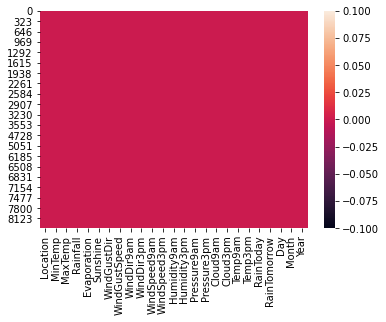

In [22]:
# Visaulize Null values on heatmap
sns.heatmap(df.isna())

There is no Null values now

As we dont have any null value present in dataset we can go ahead and visulize data with different types of plots

In [23]:
#Fist we will visualize catagoricatl data.

categorical_col

['Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

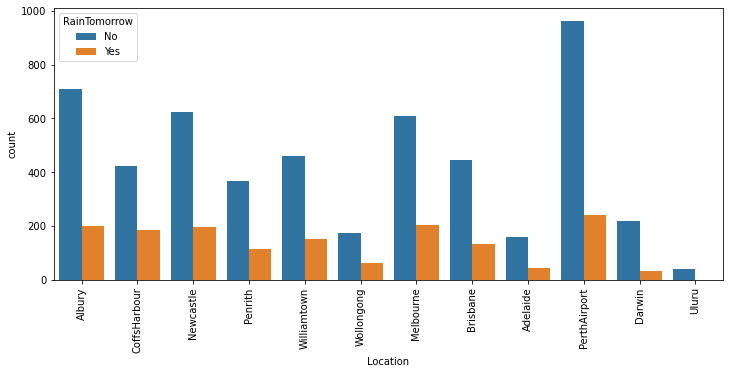

In [27]:
plt.figure(figsize=(12,5))
sns.countplot(df['Location'],hue=df['RainTomorrow'])
plt.xticks(rotation=90)
plt.show()

We can observe below points

* There is less chances of having rain in Darwin
* No Data present where we can see rain happen in UIuru
* Highest rain showing in PerthAirport

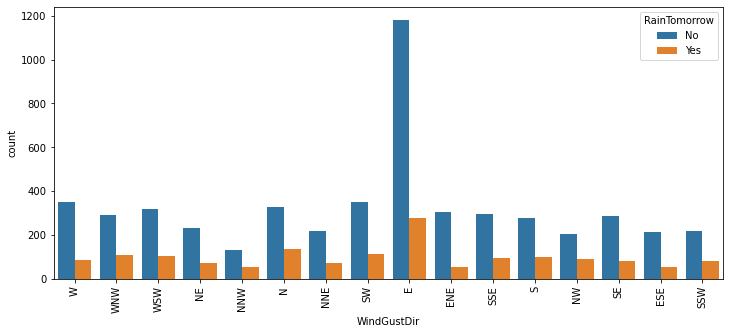

In [28]:
plt.figure(figsize=(12,5))
sns.countplot(df['WindGustDir'],hue=df['RainTomorrow'])
plt.xticks(rotation=90)
plt.show()

Rain possiblity is high when WindGustDir status is E followed by N how ever we can not conculde only wiht this single variable


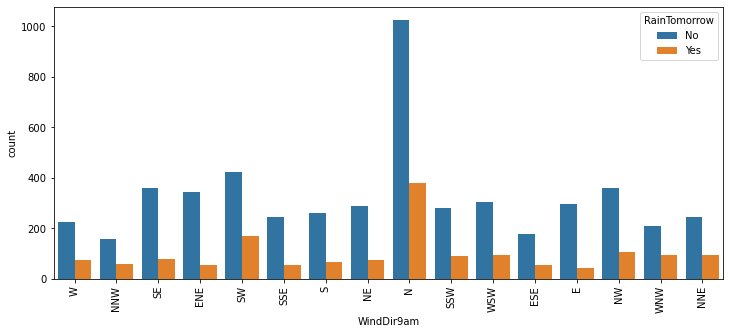

In [29]:
plt.figure(figsize=(12,5))
sns.countplot(df['WindDir9am'],hue=df['RainTomorrow'])
plt.xticks(rotation=90)
plt.show()

N Categories has highest weigh as we can see both are holding good count of information related to tomorrows rain

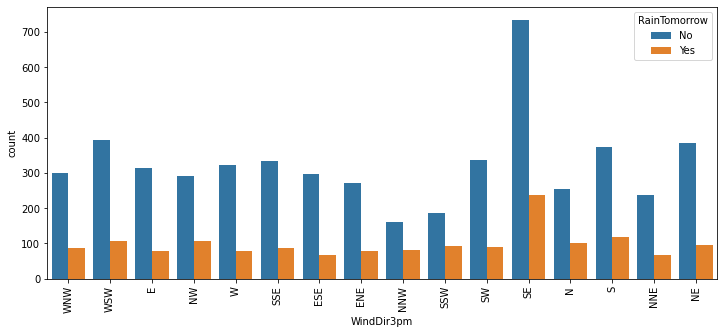

In [31]:
plt.figure(figsize=(12,5))
sns.countplot(df['WindDir3pm'],hue=df['RainTomorrow'])
plt.xticks(rotation=90)
plt.show()

* If WinDir3pm is SE then rain chances are high
* if WinDir3pm is NNE then chances of rain tomorrow is lowest


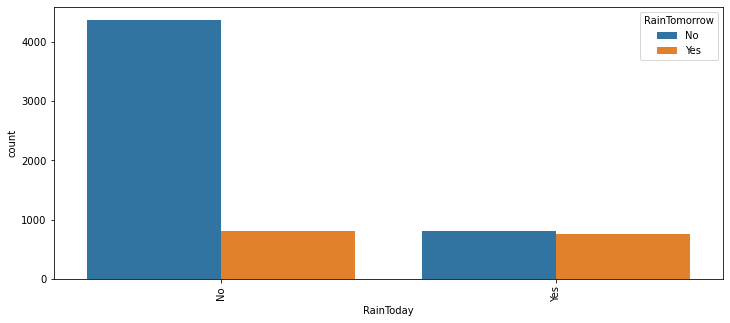

In [32]:
plt.figure(figsize=(12,5))
sns.countplot(df['RainToday'],hue=df['RainTomorrow'])
plt.xticks(rotation=90)
plt.show()

If its rains today then there is possiblity of having rain tomorrow in same count

In [33]:
# Lets visualize some Numerical data

numerical_col 

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'Day',
 'Month',
 'Year']

<AxesSubplot:xlabel='MaxTemp', ylabel='RainTomorrow'>

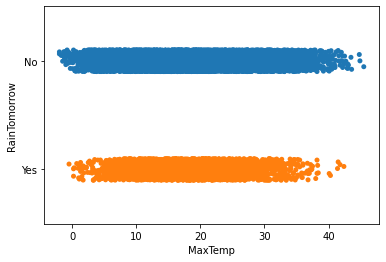

In [41]:
sns.stripplot(x=df['MinTemp'],y=df['RainTomorrow'])

<AxesSubplot:xlabel='MaxTemp', ylabel='RainTomorrow'>

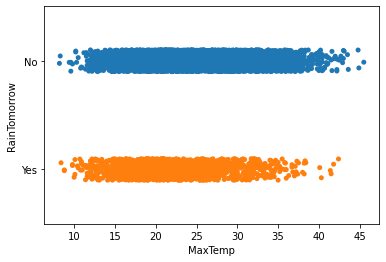

In [42]:
sns.stripplot(x=df['MaxTemp'],y=df['RainTomorrow'])

<AxesSubplot:xlabel='Evaporation', ylabel='RainTomorrow'>

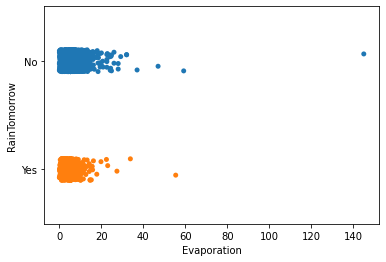

In [43]:
sns.stripplot(x=df['Evaporation'],y=df['RainTomorrow'])

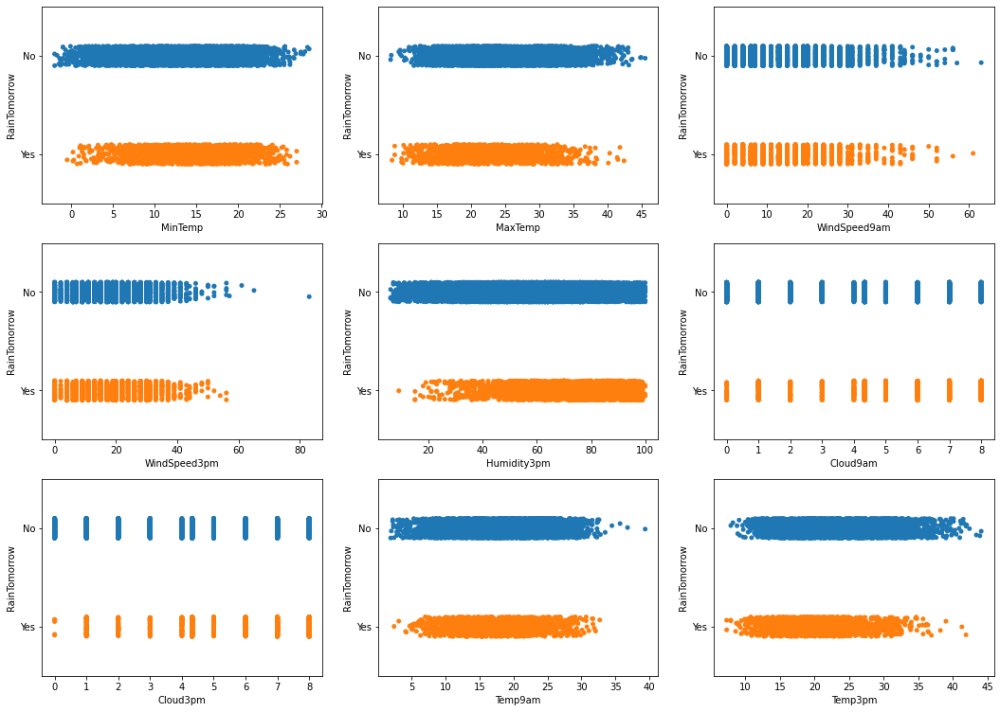

In [47]:
plt.figure(figsize=[18,13])

plt.subplot(3,3,1)
sns.stripplot(x=df['MinTemp'],y=df['RainTomorrow'])

plt.subplot(3,3,2)
sns.stripplot(x=df['MaxTemp'],y=df['RainTomorrow'])

plt.subplot(3,3,3)
sns.stripplot(x=df['WindSpeed9am'],y=df['RainTomorrow'])

plt.subplot(3,3,4)
sns.stripplot(x=df['WindSpeed3pm'],y=df['RainTomorrow'])

plt.subplot(3,3,5)
sns.stripplot(x=df['Humidity9am'],y=df['RainTomorrow'])

plt.subplot(3,3,5)
sns.stripplot(x=df['Humidity3pm'],y=df['RainTomorrow'])

plt.subplot(3,3,6)
sns.stripplot(x=df['Cloud9am'],y=df['RainTomorrow'])

plt.subplot(3,3,7)
sns.stripplot(x=df['Cloud3pm'],y=df['RainTomorrow'])

plt.subplot(3,3,8)
sns.stripplot(x=df['Temp9am'],y=df['RainTomorrow'])

plt.subplot(3,3,9)
sns.stripplot(x=df['Temp3pm'],y=df['RainTomorrow'])


plt.show()

* **Observation**

* If Mintemp in between 10 to 20 then there is chances of rain tomorrow
* If Maxtemp in 20 to 30 so it is also sign on rain
* If windspeed9am going above 40 then there is less chnace of raining
* If humidity cross 45 then this is string signle of rain
* If Temp3pm is between 15 to 30 then there is chnace of rain

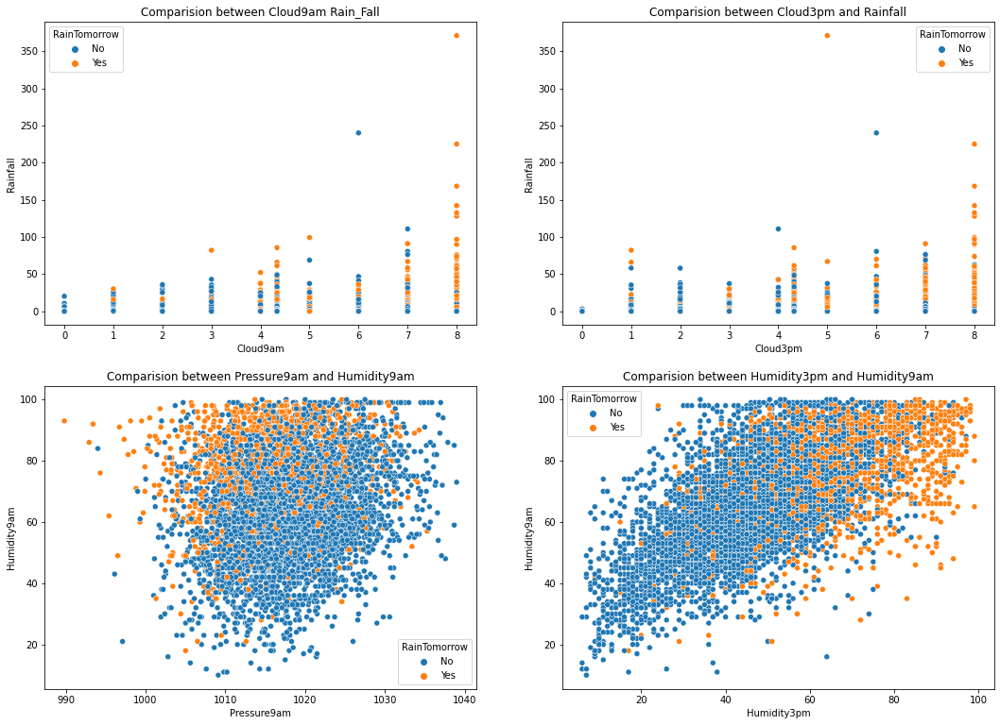

In [49]:
plt.figure(figsize=[18,13])

plt.subplot(2,2,1)
plt.title('Comparision between Cloud9am Rain_Fall')
sns.scatterplot(df['Cloud9am'],df['Rainfall'],hue=df['RainTomorrow'])

plt.subplot(2,2,2)
plt.title('Comparision between Cloud3pm and Rainfall')
sns.scatterplot(df['Cloud3pm'],df['Rainfall'],hue=df['RainTomorrow'])

plt.subplot(2,2,3)
plt.title('Comparision between Pressure9am and Humidity9am')
sns.scatterplot(df['Pressure9am'],df['Humidity9am'],hue=df['RainTomorrow'])

plt.subplot(2,2,4)
plt.title('Comparision between Humidity3pm and Humidity9am')
sns.scatterplot(df['Humidity3pm'],df['Humidity9am'],hue=df['RainTomorrow'])
plt.show()

*  **Observation**

* If Cloud9am is 7 to 8 then there is high chnace of having rain
* same goes for could3pm 
* If pressure9am is between 1010 to 1015 and Humidity9am is between 75 to 99 then there is high chnace of rain
* If Humidity3pm is above 75 then there is chnace of rain

<Figure size 3600x2160 with 0 Axes>

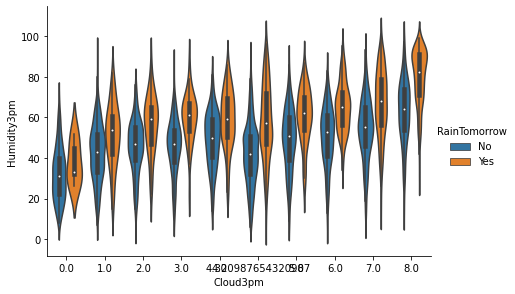

In [60]:
plt.figure(figsize=(50,30))
sns.catplot(x='Cloud3pm',
            y='Humidity3pm', 
            data=df,
            hue='RainTomorrow',
            height=4,aspect=1.5,
            kind='violin')

* Humidity should be above 60 for chances of rain

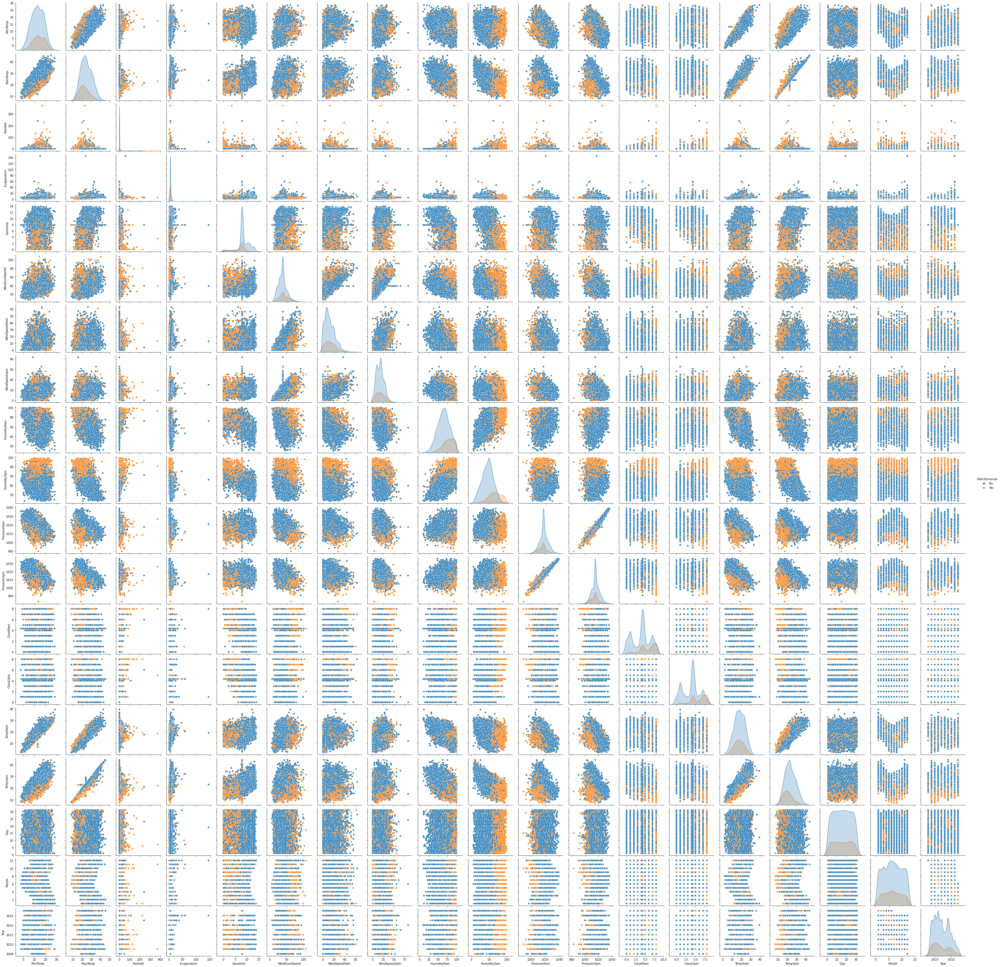

In [63]:
sns.pairplot(df,hue='RainTomorrow')
plt.show()


**Observation**

* we can see high correlation between rainfall and raintomorrow
* If is rain today then may be rain chnaces is less tomorrow
* There are some leiner relation available 

# Outliers Handling

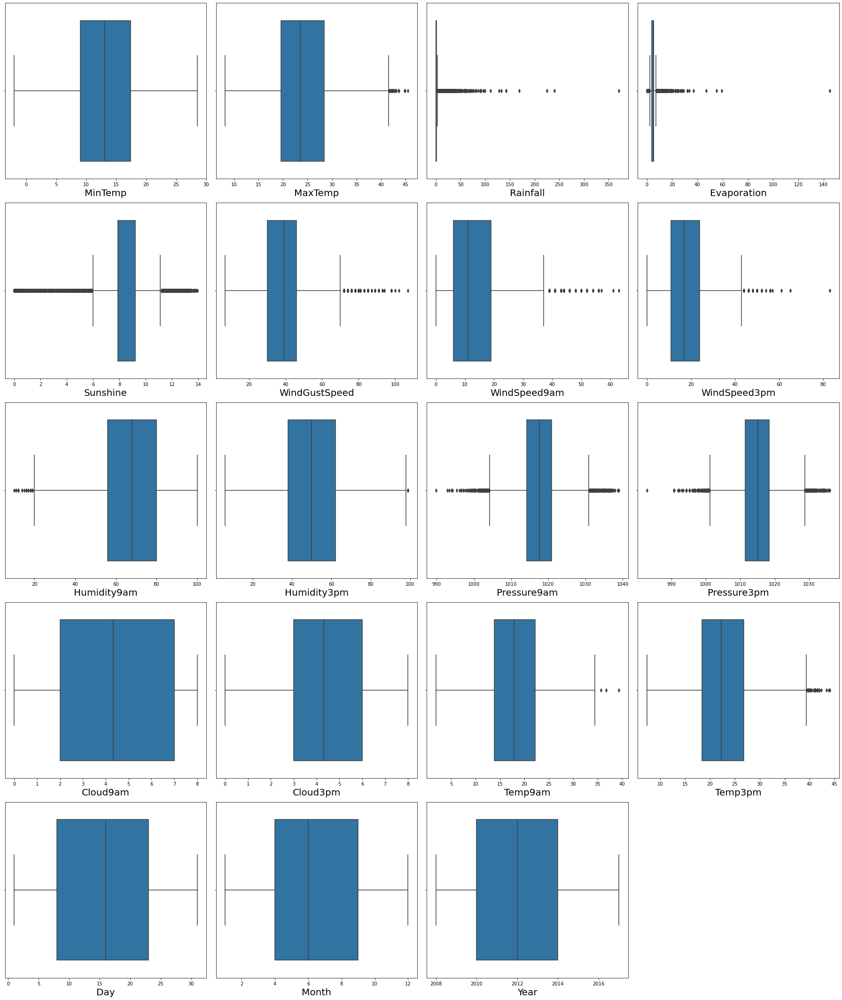

In [65]:
plt.figure(figsize=(25,35))
plotnumber=1
for column in numerical_col:
    if plotnumber<=23:
        ax=plt.subplot(6,4,plotnumber)
        sns.boxplot(df[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

We have outliers present in Dataset which we need to treat

In [67]:
features=df[['MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Pressure9am','Pressure3pm','Temp9am','Temp3pm']]

# Using zscore to remove outliers
from scipy.stats import zscore

z=np.abs(zscore(features))

z  

array([[1.95499046e-01, 2.07989811e-01, 5.31291996e-16, ...,
        1.34400174e+00, 1.73897249e-01, 1.52151947e-01],
       [1.63411012e-01, 2.65230829e-01, 5.31291996e-16, ...,
        1.22669373e+00, 1.21467920e-01, 2.66510075e-01],
       [2.61295573e-01, 2.65230829e-01, 5.31291996e-16, ...,
        1.07586914e+00, 5.42636917e-01, 8.22987852e-02],
       ...,
       [4.57064696e-01, 2.65230829e-01, 5.31291996e-16, ...,
        2.81552142e-01, 9.42860744e-01, 5.67946731e-01],
       [4.73378789e-01, 2.65230829e-01, 5.31291996e-16, ...,
        2.31277279e-01, 4.88473224e-01, 5.51200250e-01],
       [2.31837213e-15, 2.65230829e-01, 5.31291996e-16, ...,
        4.65893304e-01, 5.05949667e-01, 3.02870275e-01]])

In [68]:
# Creating new dataframe
new_df = df[(z<3).all(axis=1)] 
new_df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.900000,0.6,5.302395,7.890896,W,44.000000,W,WNW,...,1007.1,8.000000,4.320988,16.9,21.8,No,No,1,12,2008
1,Albury,7.4,25.100000,0.0,5.302395,7.890896,WNW,44.000000,NNW,WSW,...,1007.8,4.336806,4.320988,17.2,24.3,No,No,2,12,2008
2,Albury,12.9,25.700000,0.0,5.302395,7.890896,WSW,46.000000,W,WSW,...,1008.7,4.336806,2.000000,21.0,23.2,No,No,3,12,2008
3,Albury,9.2,28.000000,0.0,5.302395,7.890896,NE,24.000000,SE,E,...,1012.8,4.336806,4.320988,18.1,26.5,No,No,4,12,2008
4,Albury,17.5,32.300000,1.0,5.302395,7.890896,W,41.000000,ENE,NW,...,1006.0,7.000000,8.000000,17.8,29.7,No,No,5,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.400000,0.0,5.302395,7.890896,E,31.000000,SE,ENE,...,1020.3,4.336806,4.320988,10.1,22.4,No,No,21,6,2017
8421,Uluru,3.6,25.300000,0.0,5.302395,7.890896,NNW,22.000000,SE,N,...,1019.1,4.336806,4.320988,10.9,24.5,No,No,22,6,2017
8422,Uluru,5.4,26.900000,0.0,5.302395,7.890896,N,37.000000,SE,WNW,...,1016.8,4.336806,4.320988,12.5,26.1,No,No,23,6,2017
8423,Uluru,7.8,27.000000,0.0,5.302395,7.890896,SE,28.000000,SSE,N,...,1016.5,3.000000,2.000000,15.1,26.0,No,No,24,6,2017


In [70]:
df.shape

(6762, 25)

In [71]:
new_df.shape

(6409, 25)

In [72]:
# Total Data Loss 
dataloss=(6762-6409)/6762
dataloss*100

5.220349009168885

We will have 5.2 % data loss which is acceptable

# Finding Skewness

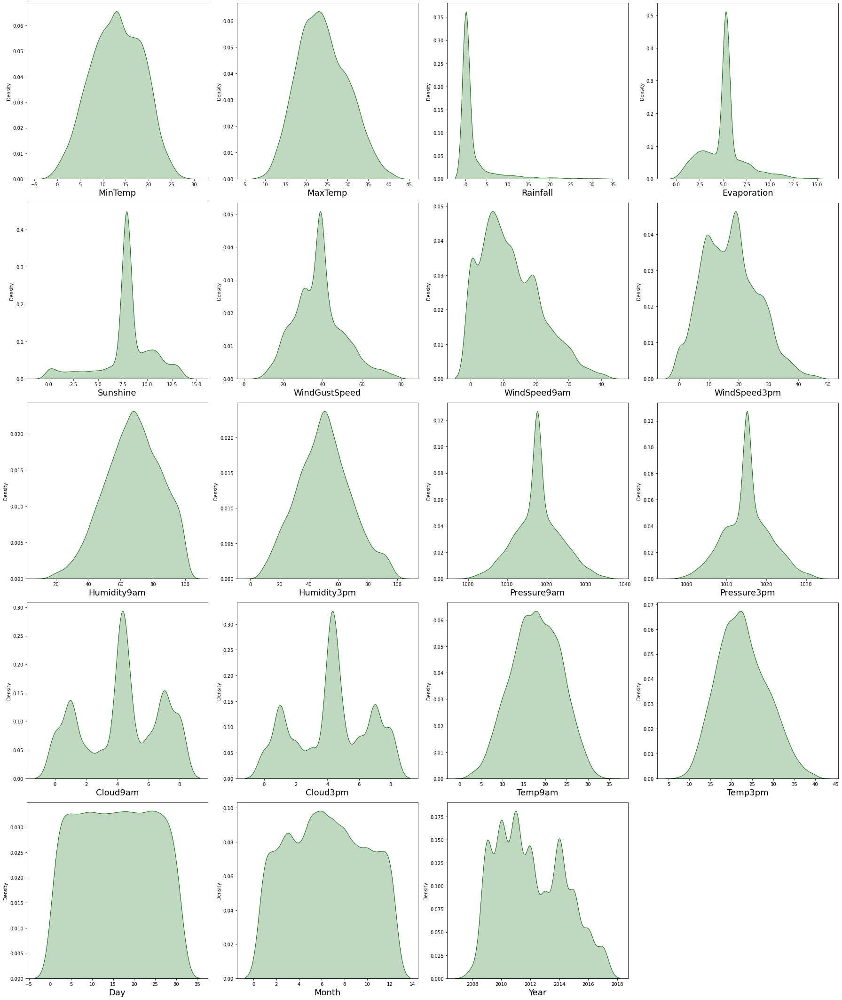

In [74]:
plt.figure(figsize=(25,35))
plotnumber=1
for column in numerical_col:
    if plotnumber<=23:
        ax=plt.subplot(6,4,plotnumber)
        sns.distplot(new_df[column],color="darkgreen",hist=False,kde_kws={"shade": True})
        plt.xlabel(column,fontsize=18)
    plotnumber+=1
plt.tight_layout()

In [75]:
new_df.skew()

MinTemp         -0.079107
MaxTemp          0.265797
Rainfall         3.515410
Evaporation      0.721400
Sunshine        -0.890629
WindGustSpeed    0.477235
WindSpeed9am     0.677433
WindSpeed3pm     0.341549
Humidity9am     -0.233044
Humidity3pm      0.158509
Pressure9am      0.064023
Pressure3pm      0.090093
Cloud9am        -0.203578
Cloud3pm        -0.147217
Temp9am         -0.072513
Temp3pm          0.290192
Day              0.004771
Month            0.032770
Year             0.352924
dtype: float64

We can see that Rainfall has highest Skewness

# Removing Skewness using yeo-johnson method

In [76]:
skew=['Rainfall','Evaporation','WindGustSpeed','WindSpeed9am','WindSpeed3pm']
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

new_df[skew] = scaler.fit_transform(new_df[skew].values)
new_df[skew].head()

,Rainfall,Evaporation,WindGustSpeed,WindSpeed9am,WindSpeed3pm
0,0.685674,0.155534,0.539153,0.905389,0.780100
1,-0.674943,0.155534,0.539153,-0.858881,0.583429
2,-0.674943,0.155534,0.689470,0.822838,0.972106
3,-0.674943,0.155534,-1.187171,0.067403,-0.861972
4,1.045503,0.155534,0.307645,-0.411105,0.381560


In [77]:
new_df[skew].skew()

Rainfall         0.970931
Evaporation      0.071784
WindGustSpeed    0.005062
WindSpeed9am    -0.132158
WindSpeed3pm    -0.078622
dtype: float64

We have reduced skewness for skewed columns

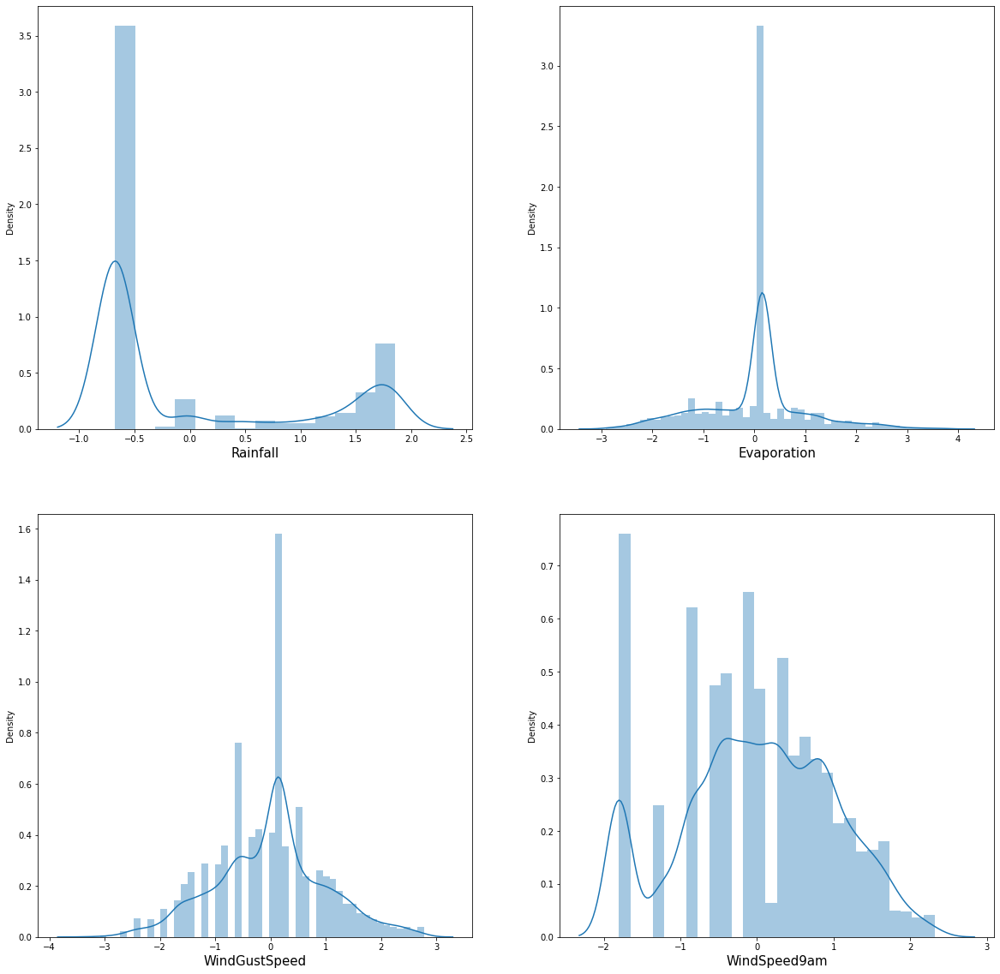

In [78]:
# Checking skewness graph after removing skewness

plt.figure(figsize=(20,20))
plotnumber = 1

for column in new_df[skew]:
    if plotnumber<=4:
        ax = plt.subplot(2,2,plotnumber)
        sns.distplot(new_df[column])
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.show()

# Encoding Catagorical features

In [79]:
from sklearn.preprocessing import LabelEncoder

LE=LabelEncoder()
new_df[categorical_col]= new_df[categorical_col].apply(LE.fit_transform)

In [80]:
new_df.dtypes

Location           int32
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir        int32
WindGustSpeed    float64
WindDir9am         int32
WindDir3pm         int32
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday          int32
RainTomorrow       int32
Day                int64
Month              int64
Year               int64
dtype: object

Our Data is Encoded now as we can see in above table

# Correlation of dependant and independant variable with each other

In [81]:
cor = new_df.corr()
cor

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
Location,1.000000,0.091439,0.073529,0.015444,0.119698,0.059077,-0.087036,0.283514,-0.102857,-0.000346,...,-0.018320,-0.006174,-0.005406,0.098705,0.069773,-0.004653,0.000418,-0.004955,-0.070870,0.504670
MinTemp,0.091439,1.000000,0.730203,0.082426,0.359824,0.045007,-0.141975,0.258827,-0.021262,-0.143715,...,-0.447642,0.095244,0.045078,0.892887,0.699067,0.072751,0.093202,0.018823,-0.235576,0.033619
MaxTemp,0.073529,0.730203,1.000000,-0.243081,0.470427,0.358251,-0.203423,0.182766,-0.193433,-0.165553,...,-0.426387,-0.240845,-0.239589,0.865352,0.974864,-0.219715,-0.158541,0.020013,-0.173102,0.084633
Rainfall,0.015444,0.082426,-0.243081,1.000000,-0.209067,-0.281037,0.117857,0.086976,0.152822,0.113444,...,-0.039563,0.320959,0.276243,-0.102993,-0.255331,0.889895,0.328784,-0.013803,0.013239,0.019433
Evaporation,0.119698,0.359824,0.470427,-0.209067,1.000000,0.405719,-0.139166,0.201388,-0.131351,-0.025713,...,-0.304517,-0.112710,-0.160846,0.421538,0.459295,-0.180903,-0.108688,0.005752,-0.050976,0.123489
Sunshine,0.059077,0.045007,0.358251,-0.281037,0.405719,1.000000,-0.096169,0.044335,-0.079345,-0.053672,...,-0.084864,-0.535310,-0.558181,0.242516,0.376674,-0.238391,-0.334757,-0.002603,0.001859,0.055028
WindGustDir,-0.087036,-0.141975,-0.203423,0.117857,-0.139166,-0.096169,1.000000,-0.015005,0.382238,0.455730,...,-0.007103,0.113797,0.074331,-0.158044,-0.214280,0.108601,0.034610,0.016953,0.033051,-0.184693
WindGustSpeed,0.283514,0.258827,0.182766,0.086976,0.201388,0.044335,-0.015005,1.000000,-0.067435,0.096452,...,-0.323988,-0.005331,0.033371,0.242438,0.151218,0.076873,0.156295,-0.004452,0.050801,-0.003830
WindDir9am,-0.102857,-0.021262,-0.193433,0.152822,-0.131351,-0.079345,0.382238,-0.067435,1.000000,0.207631,...,0.058118,0.070864,0.054555,-0.067048,-0.202146,0.149524,0.034901,-0.007416,0.022424,-0.083633
WindDir3pm,-0.000346,-0.143715,-0.165553,0.113444,-0.025713,-0.053672,0.455730,0.096452,0.207631,1.000000,...,-0.040758,0.070165,0.049111,-0.150565,-0.176777,0.095603,-0.000224,0.001373,0.029937,0.005251


<AxesSubplot:>

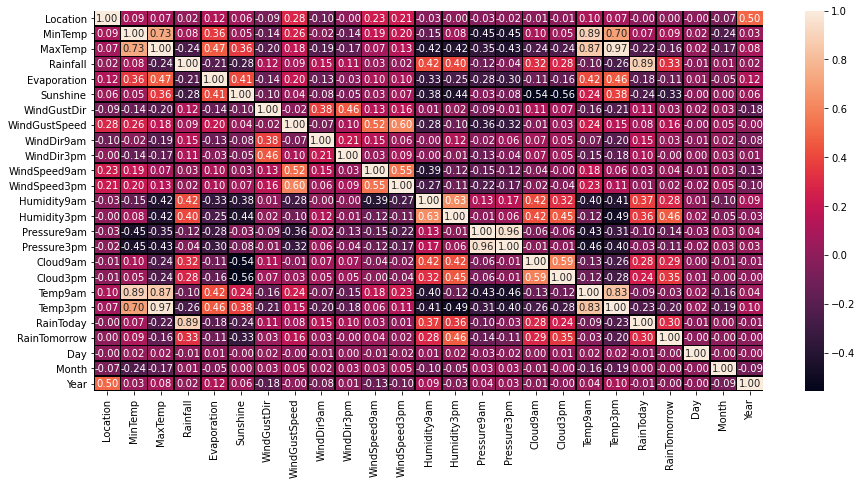

In [82]:
#Visualizing correlation with Heatmap

plt.figure(figsize=(15,7))
sns.heatmap(new_df.corr(),annot=True,linewidths=0.6,linecolor="black",fmt='.2f')

**Observation**

* Humidity3pm has highest positive correlation with Raintomorrow
* Location has almost no 0 correlation 
* Cloudepm has also postive correaltion
* Sunshine has high negative correlation

Visualising corraltion with Bar plot

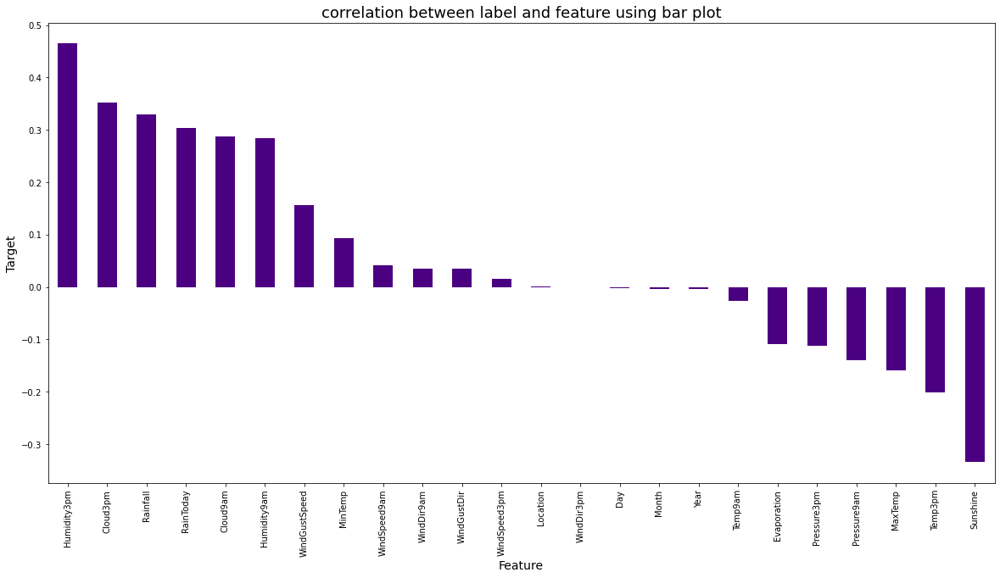

In [84]:
plt.figure(figsize=(20,10))
new_df.corr()['RainTomorrow'].sort_values(ascending=False).drop(['RainTomorrow']).plot(kind='bar',color='indigo')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Target',fontsize=14)
plt.title('correlation between label and feature using bar plot',fontsize=18)
plt.show()

In [85]:
# Dropping WindDir3pm as it is not having much correaltion

new_df.drop('WindDir3pm',axis=1,inplace=True)

# Outliers and skewness are removed now and we are ready to define X and Y

In [94]:
x = new_df.drop('RainTomorrow', axis=1)
y = new_df['RainTomorrow']
x.shape

(6409, 23)

In [95]:
y.shape

(6409,)

# Scaling Data

In [96]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindSpeed9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Day,Month,Year
0,-1.391396,0.069172,-0.190821,0.685674,0.155534,-0.017794,1.222524,0.539153,1.317076,0.905389,...,-1.759834,-1.436942,1.495570,0.017600,-0.162690,-0.149628,-0.535675,-1.672284,1.655296,-1.770498
1,-1.391396,-1.013829,0.174339,-0.674943,0.155534,-0.017794,1.413467,0.539153,-0.222676,-0.858881,...,-1.252796,-1.313436,0.014663,0.017600,-0.109936,0.276421,-0.535675,-1.558519,1.655296,-1.770498
2,-1.391396,-0.021078,0.273928,-0.674943,0.155534,-0.017794,1.604410,0.689470,1.317076,0.822838,...,-1.777318,-1.154643,0.014663,-0.982885,0.558287,0.088960,-0.535675,-1.444754,1.655296,-1.770498
3,-1.391396,-0.688929,0.655685,-0.674943,0.155534,-0.017794,-0.495963,-1.187171,0.437218,0.067403,...,-0.028909,-0.431253,0.014663,0.017600,0.048327,0.651345,-0.535675,-1.330989,1.655296,-1.770498
4,-1.391396,0.809223,1.369406,1.045503,0.155534,-0.017794,1.222524,0.307645,-1.322499,-0.411105,...,-1.217827,-1.631022,1.091303,1.603475,-0.004427,1.196689,-0.535675,-1.217224,1.655296,-1.770498


# Checking Variance inflation (VIF)

In [98]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.650870,Location
1,9.308380,MinTemp
2,26.283312,MaxTemp
3,5.368586,Rainfall
4,1.625689,Evaporation
5,2.020505,Sunshine
6,1.386404,WindGustDir
7,2.132751,WindGustSpeed
8,1.346554,WindDir9am
9,2.014950,WindSpeed9am


In [99]:
#Highest VIF we can see is showing for Temp3pm

# We will drop that

x.drop('Temp3pm',axis=1,inplace=True)



In [100]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.650781,Location
1,9.264805,MinTemp
2,9.698691,MaxTemp
3,5.368493,Rainfall
4,1.624636,Evaporation
5,2.020346,Sunshine
6,1.380010,WindGustDir
7,2.124189,WindGustSpeed
8,1.345220,WindDir9am
9,2.014551,WindSpeed9am


In [101]:
# I will remove Pressure9am as well

x.drop('Pressure9am',axis=1,inplace=True)

In [102]:
# Checking VIF again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.648876,Location
1,9.199690,MinTemp
2,9.319987,MaxTemp
3,5.329484,Rainfall
4,1.600762,Evaporation
5,2.013436,Sunshine
6,1.329543,WindGustDir
7,2.091748,WindGustSpeed
8,1.316231,WindDir9am
9,2.003869,WindSpeed9am


In [103]:
# Finally I will remove Temp9am

x.drop('Temp9am',axis=1,inplace=True)

In [104]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.645858,Location
1,4.819742,MinTemp
2,5.623072,MaxTemp
3,5.325205,Rainfall
4,1.584723,Evaporation
5,1.990576,Sunshine
6,1.328445,WindGustDir
7,2.058716,WindGustSpeed
8,1.315181,WindDir9am
9,1.980405,WindSpeed9am


Now as we can see our all VIF values are below 10 so we should stop hear and go ahead towards model training

In [105]:
y.value_counts()

0    4979
1    1430
Name: RainTomorrow, dtype: int64

We can see above our data is imbalanced Hence we should balance our Data first before training model

# Oversampling Using SMOT

In [106]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x, y = SM.fit_resample(x,y)

In [107]:
# Checking value count of target column
y.value_counts()

1    4979
0    4979
Name: RainTomorrow, dtype: int64

We can see dummy Data got added now

# Finding Random State

In [108]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
from sklearn.metrics import classification_report
from sklearn.metrics import plot_roc_curve
maxAcc = 0
maxRS = 0

for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.20, random_state=i)
    modRF = RandomForestClassifier()
    modRF.fit(x_train,y_train)
    pred = modRF.predict(x_test)
    acc = accuracy_score(y_test,pred)
    if acc>maxAcc:
        maxAcc = acc
        maxRs=i
print(f"Best Accuracy is: {maxAcc} on Random State: {maxRs}")

Best Accuracy is: 0.9201807228915663 on Random State: 61


### We found our best random state which is 61 having 92% accuracy

In [109]:
#Spliting Data with high random state
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.20, random_state=61)

In [111]:
# Importing Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, BaggingClassifier

In [112]:
LOGR = LogisticRegression(solver = 'liblinear')
RFC = RandomForestClassifier()
DTC = DecisionTreeClassifier()
SV = SVC()
KNN = KNeighborsClassifier()
EXT=ExtraTreesClassifier()
Gbc=GradientBoostingClassifier()
BG=BaggingClassifier()

model=[LOGR,RFC,DTC,SV,KNN,EXT,Gbc,BG]


for i in model:
    i.fit(x_train,y_train)
    predi=i.predict(x_test)
    print('performance matrix of',i,'is:')
    print("Confusion matrix :",confusion_matrix(y_test,predi))
    print("Classification report :", classification_report(y_test,predi,))
    print("Accuracy score :", accuracy_score(y_test,predi))
    print("*****************************************************************")

performance matrix of LogisticRegression(solver='liblinear') is:
Confusion matrix : [[811 192]
 [218 771]]
Classification report :               precision    recall  f1-score   support

           0       0.79      0.81      0.80      1003
           1       0.80      0.78      0.79       989

    accuracy                           0.79      1992
   macro avg       0.79      0.79      0.79      1992
weighted avg       0.79      0.79      0.79      1992

Accuracy score : 0.7941767068273092
*****************************************************************
performance matrix of RandomForestClassifier() is:
Confusion matrix : [[913  90]
 [ 81 908]]
Classification report :               precision    recall  f1-score   support

           0       0.92      0.91      0.91      1003
           1       0.91      0.92      0.91       989

    accuracy                           0.91      1992
   macro avg       0.91      0.91      0.91      1992
weighted avg       0.91      0.91      0.91      19

In [113]:
from sklearn.model_selection import cross_val_score
j=[LOGR,RFC,DTC,SV,KNN,EXT,Gbc,BG]
for n in j:
  print('Cross_Validation_score of',n,'is')
  score=cross_val_score(n,x,y,cv=5)
  print(score)
  print(score.mean())
  print(score.std())
  print('\n')

Cross_Validation_score of LogisticRegression(solver='liblinear') is
[0.70230924 0.64508032 0.65662651 0.7654445  0.82320442]
0.7185329968795322
0.06730188034794793


Cross_Validation_score of RandomForestClassifier() is
[0.57329317 0.56726908 0.64056225 0.77749874 0.85986941]
0.6836985309394282
0.11613833075352772


Cross_Validation_score of DecisionTreeClassifier() is
[0.56325301 0.49096386 0.65963855 0.74585635 0.73681567]
0.6393054891590471
0.09905955308698614


Cross_Validation_score of SVC() is
[0.6501004  0.58383534 0.65512048 0.77900552 0.814666  ]
0.6965455493495832
0.08640470664846192


Cross_Validation_score of KNeighborsClassifier() is
[0.63453815 0.5747992  0.66967871 0.75087896 0.78252135]
0.682483273122626
0.07582102210639631


Cross_Validation_score of ExtraTreesClassifier() is
[0.61746988 0.59236948 0.68373494 0.81165244 0.88247112]
0.7175395706381529
0.11214623994632159


Cross_Validation_score of GradientBoostingClassifier() is
[0.56777108 0.50050201 0.61546185 0.7026

In [115]:
#Checking difference between accuracy score and cross validation score

Models=["LOGR","RFC","DTC","SV","KNN","EXT","Gbc","BG"]
Accuracy=[78,87,80,82,79,86,84,85]
Cross_va=[78,85,80,80,78,85,82,84]

In [116]:
# Finding difference

score_diff=[]
for i in range(len(Accuracy)):
    score_diff.append(Accuracy[i]-Cross_va[i])

In [117]:
models=pd.DataFrame({})
models["Models"]=Models#
models["Accuracy"]=Accuracy
models["Cross_va"]=Cross_va
models["Differance"]=score_diff
models

,Models,Accuracy,Cross_va,Differance
0,LOGR,78,78,0
1,RFC,87,85,2
2,DTC,80,80,0
3,SV,82,80,2
4,KNN,79,78,1
5,EXT,86,85,1
6,Gbc,84,82,2
7,BG,85,84,1


We can see decision Tree classifier is having good matrix as there is 0 difference between accuracy score and cross validation score

We also have logistic regression with 0 difference but accuracy score is high for decision tree hence we will select decision tree for hyperparameter tunning

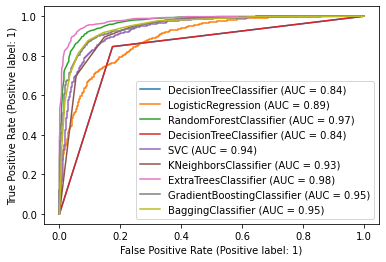

In [118]:
disp = plot_roc_curve(DTC,x_test,y_test)
mod = [LOGR,RFC,DTC,SV,KNN,EXT,Gbc,BG]

for i in mod:
    plot_roc_curve(i,x_test,y_test, ax=disp.ax_)
plt.legend(prop = {'size':10}, loc = 'lower right')
plt.show()

Other models are also working Good but they have high difference between cross validation score and accuracy score hence we will stick on decision tree classifier

# Hypertunning parameter for decision tree classifier

In [122]:
from sklearn.model_selection import GridSearchCV



parameters={"random_state":[61],"criterion": ['gini', 'entropy'],"max_depth":[2,4,6,8,10,12],"min_samples_leaf":[2,3,4,5,6]}

GVC=GridSearchCV(DecisionTreeClassifier(),parameters,cv=5)

In [123]:
GVC.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 4, 6, 8, 10, 12],
                         'min_samples_leaf': [2, 3, 4, 5, 6],
                         'random_state': [61]})

In [124]:
GVC.best_params_

{'criterion': 'gini',
 'max_depth': 12,
 'min_samples_leaf': 2,
 'random_state': 61}

In [125]:
#initialising GradientBoost with best parameter
Rain_tomo=DecisionTreeClassifier(criterion= 'gini',max_depth= 12,min_samples_leaf= 2,random_state=61)

In [126]:
Rain_tomo.fit(x_train, y_train)
pred = Rain_tomo.predict(x_test)
acc=accuracy_score(y_test,DTC.predict(x_test))
print("Accuracy Score",acc*100)

Accuracy Score 83.58433734939759


### We have increased 3% accuracy by hypertunning parameters

# saving the model

In [127]:
# Saving the model using .pkl

import joblib
joblib.dump(Rain_tomo,"Rain_tomorrow")

['Rain_tomorrow']

# Loading model to use

In [128]:

# Loading the saved model
model=joblib.load("Rain_tomorrow")

#Prediction
prediction = model.predict(x_test)
prediction

array([1, 0, 0, ..., 1, 1, 0])

# ROC Curve

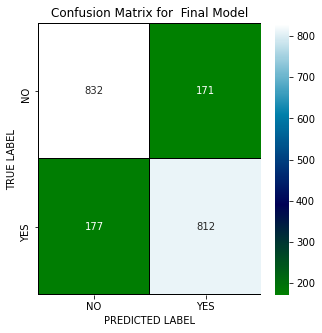

In [131]:
# Lets plot confusion matrix for  FinalModel
cm = confusion_matrix(y_test,prediction)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

f , ax = plt.subplots(figsize=(5,5))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="ocean",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for  Final Model')
plt.show()

# Plotting ROC and Compare AUC for the best model

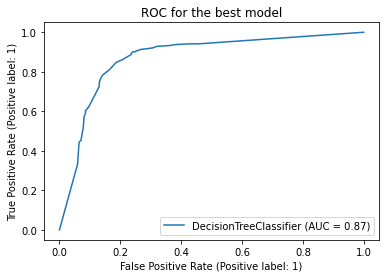

In [132]:
# Let's check the Auc for the best model after hyper parameter tuning
plot_roc_curve(Rain_tomo, x_test, y_test)
plt.title("ROC for the best model")
plt.show()

In [133]:
a=np.array(y_test)
Class_Result=pd.DataFrame({'Original':a,'Prediction':prediction})
Class_Result

,Original,Prediction
0,1,1
1,0,0
2,0,0
3,0,0
4,0,0
...,...,...
1987,0,0
1988,0,0
1989,1,1
1990,1,1


### Above is comparision between acutal value and predicted value by our trained model and they are matching up to 83 %

# Now lets predict Rainfall

## Correlation

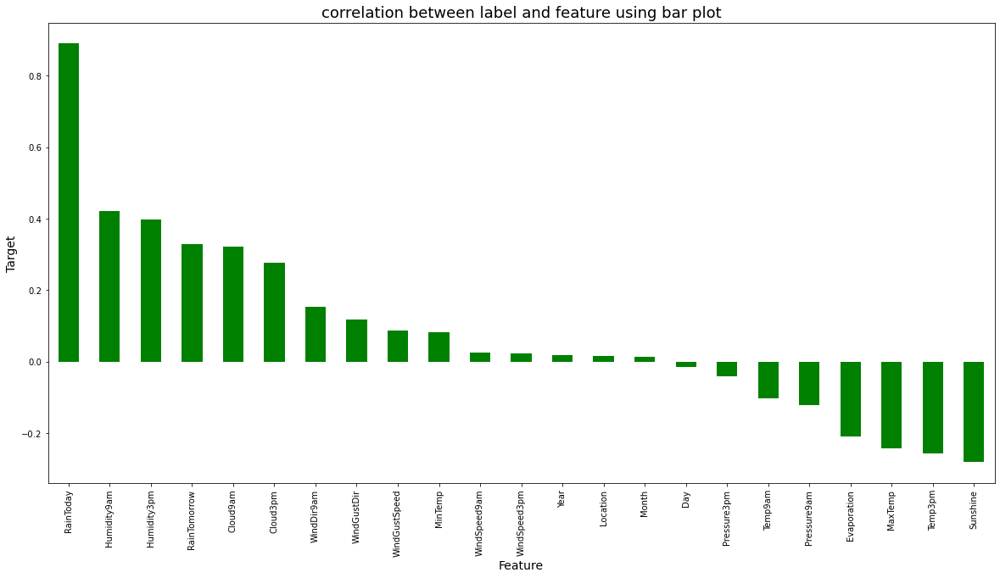

In [134]:
plt.figure(figsize=(20,10))
new_df.corr()['Rainfall'].sort_values(ascending=False).drop(['Rainfall']).plot(kind='bar',color='g')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Target',fontsize=14)
plt.title('correlation between label and feature using bar plot',fontsize=18)
plt.show()

We can see all columns has correlation and month has lowest one however we need to keep month is Data as it will help us to predict exact day of rain

# Defining X and Y

In [135]:
x = new_df.drop("Rainfall", axis=1)
y = new_df["Rainfall"]

# Scalling Data

In [136]:
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindSpeed9am,WindSpeed3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,-1.391396,0.069172,-0.190821,0.155534,-0.017794,1.222524,0.539153,1.317076,0.905389,0.780100,...,-1.436942,1.495570,0.017600,-0.162690,-0.149628,-0.535675,-0.535916,-1.672284,1.655296,-1.770498
1,-1.391396,-1.013829,0.174339,0.155534,-0.017794,1.413467,0.539153,-0.222676,-0.858881,0.583429,...,-1.313436,0.014663,0.017600,-0.109936,0.276421,-0.535675,-0.535916,-1.558519,1.655296,-1.770498
2,-1.391396,-0.021078,0.273928,0.155534,-0.017794,1.604410,0.689470,1.317076,0.822838,0.972106,...,-1.154643,0.014663,-0.982885,0.558287,0.088960,-0.535675,-0.535916,-1.444754,1.655296,-1.770498
3,-1.391396,-0.688929,0.655685,0.155534,-0.017794,-0.495963,-1.187171,0.437218,0.067403,-0.861972,...,-0.431253,0.014663,0.017600,0.048327,0.651345,-0.535675,-0.535916,-1.330989,1.655296,-1.770498
4,-1.391396,0.809223,1.369406,0.155534,-0.017794,1.222524,0.307645,-1.322499,-0.411105,0.381560,...,-1.631022,1.091303,1.603475,-0.004427,1.196689,-0.535675,-0.535916,-1.217224,1.655296,-1.770498


# Checking VIF

In [137]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.658031,Location
1,9.233477,MinTemp
2,26.300212,MaxTemp
3,1.615539,Evaporation
4,2.045040,Sunshine
5,1.387968,WindGustDir
6,2.198580,WindGustSpeed
7,1.346698,WindDir9am
8,2.017019,WindSpeed9am
9,1.955327,WindSpeed3pm


In [138]:
# We will remove Temp3pm first as it has highest VIF value

x.drop('Temp3pm',axis=1,inplace=True)

In [139]:
# Checking VIF Again

vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.657944,Location
1,9.190467,MinTemp
2,9.709824,MaxTemp
3,1.614456,Evaporation
4,2.044874,Sunshine
5,1.381571,WindGustDir
6,2.190060,WindGustSpeed
7,1.345360,WindDir9am
8,2.016619,WindSpeed9am
9,1.952190,WindSpeed3pm


In [140]:
# Now we will remove Pressure9am

x.drop('Pressure9am',axis=1,inplace=True)

In [141]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.656588,Location
1,9.115742,MinTemp
2,9.332586,MaxTemp
3,1.592884,Evaporation
4,2.035865,Sunshine
5,1.328392,WindGustDir
6,2.148126,WindGustSpeed
7,1.316470,WindDir9am
8,2.006787,WindSpeed9am
9,1.945449,WindSpeed3pm


In [142]:
# At the end we have Temp9am with VIF value above 10 so we will drop that as well

x.drop('Temp9am',axis=1,inplace=True)

In [143]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.653730,Location
1,4.778706,MinTemp
2,5.602222,MaxTemp
3,1.577475,Evaporation
4,2.013729,Sunshine
5,1.327342,WindGustDir
6,2.115937,WindGustSpeed
7,1.315487,WindDir9am
8,1.983599,WindSpeed9am
9,1.896462,WindSpeed3pm


### Now we are all set to move forward as  we have cleared all high VIF values from Dataset

# Finding best random state

In [144]:
import sklearn
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR

#metrics
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score

In [145]:
maxAcc = 0
maxRS = 0

for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.20, random_state=i)
    modRF = RandomForestRegressor()
    modRF.fit(x_train,y_train)
    pred = modRF.predict(x_test)
    acc = r2_score(y_test,pred)
    if acc>maxAcc:
        maxAcc = acc
        maxRs=i
print(f"Best Accuracy is: {maxAcc} on Random State: {maxRs}")

Best Accuracy is: 0.8636505226762335 on Random State: 155


### We have our best random state with 86 % accuracy

In [146]:
#Spliting traintest data and setting random state as 155

x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.20, random_state=155)

In [147]:
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

dt=DecisionTreeRegressor()
kn=KNeighborsRegressor()
adb=AdaBoostRegressor()
gdb=GradientBoostingRegressor()
lnr=LinearRegression()
rfr=RandomForestRegressor()
sv=SVR()
lss=Lasso(alpha=10)

model=[dt,kn,adb,gdb,lnr,rfr,sv,lss]

for i in model:
    i.fit(x_train,y_train)
    predi=i.predict(x_test)
    print('performance matrix of',i,'is:')
    print("RMSE Score is:",mean_squared_error(y_test,predi))
    print('MAE:',mean_absolute_error(y_test, predi))
    print('MSE:',mean_squared_error(y_test, predi))
    r2 = r2_score(y_test, predi)*100
    print("R2 Score is:", r2)
    cv_score = (cross_val_score(i, x, y, cv=5).mean())*100
    print("Cross Validation Score:", cv_score)
    result = r2 - cv_score
    print("R2 Score - Cross Validation Score is", result)
    print("*****************************************************************")

performance matrix of DecisionTreeRegressor() is:
RMSE Score is: 0.30873179450221055
MAE: 0.2669681678434496
MSE: 0.30873179450221055
R2 Score is: 68.81221244585525
Cross Validation Score: 58.70315881060731
R2 Score - Cross Validation Score is 10.109053635247939
*****************************************************************
performance matrix of KNeighborsRegressor() is:
RMSE Score is: 0.20207273106099416
MAE: 0.25946911220718627
MSE: 0.20207273106099416
R2 Score is: 79.58680797040168
Cross Validation Score: 74.61075699551557
R2 Score - Cross Validation Score is 4.976050974886107
*****************************************************************
performance matrix of AdaBoostRegressor() is:
RMSE Score is: 0.23408758271825778
MAE: 0.38773667521213556
MSE: 0.23408758271825778
R2 Score is: 76.35269859182567
Cross Validation Score: 73.09354338312004
R2 Score - Cross Validation Score is 3.2591552087056357
*****************************************************************
performance matrix

### We can see that in above matrix LinearRegression  is working best because it has 84 R2 score and 80 cross validation score which means least difference between both among all other models

In [148]:
Rainmodel=LinearRegression()

Rainmodel.fit(x_train,y_train)
pred = Rainmodel.predict(x_test)
print('R2_Score:',r2_score(y_test,pred)*100)

R2_Score: 84.84553515963673


# Saving Best Model

In [149]:
# Saving the model using .pkl
import joblib
joblib.dump(Rainmodel,"Raincount")

['Raincount']

In [150]:
#Lets use saved model

model=joblib.load("Raincount")

#Prediction
prediction = model.predict(x_test)
prediction

array([-0.56520161, -0.46268804,  1.71534953, ..., -0.54005375,
       -0.75308585,  1.62395889])

In [154]:
a = np.array(y_test)
prediction = pd.DataFrame({"Original":a,"Predicted":prediction},index=range(len(a)))
prediction

,Original,Predicted
0,-0.674943,-0.565202
1,-0.021030,-0.462688
2,1.788025,1.715350
3,-0.674943,-0.480181
4,-0.674943,-0.330947
...,...,...
1277,-0.674943,-0.567453
1278,1.806387,1.852559
1279,-0.674943,-0.540054
1280,-0.674943,-0.753086


# We have trained our model with 84 of accuracy

## Thank you